In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

In [ ]:
fake=pd.read_csv("https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv")

In [ ]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
fake.columns
#Index(["title", "text", "subject", "date"], dtype="object")

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

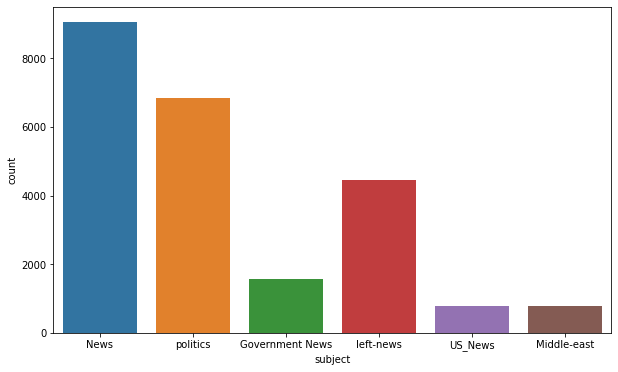

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x= "subject",data=fake)    

Word Cloud

In [ ]:
text =" ".join(fake["text"].tolist())

In [ ]:
" ".join(["this","is","a","data"])

'this is a data'

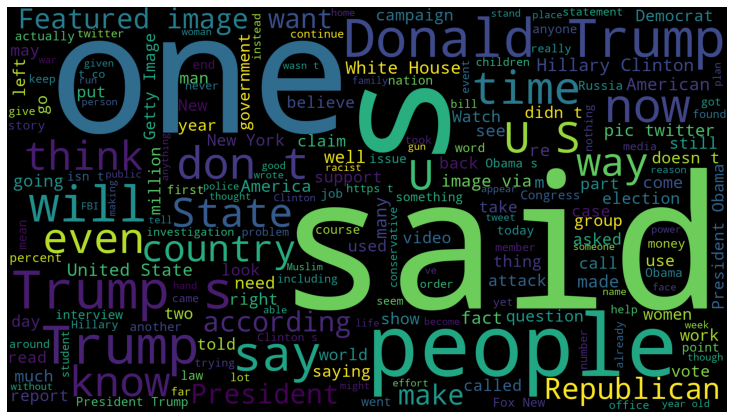

In [ ]:
wordcloud = WordCloud(width=1920,height=1080).generate(text)
fig=plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()

Real News


In [ ]:
real = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')

In [ ]:
real.head()

,title,text,subject,date
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017"
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017"
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017"
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017"
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017"


In [ ]:
text = ' '.join(real['text'].tolist())
len(text)


51064092

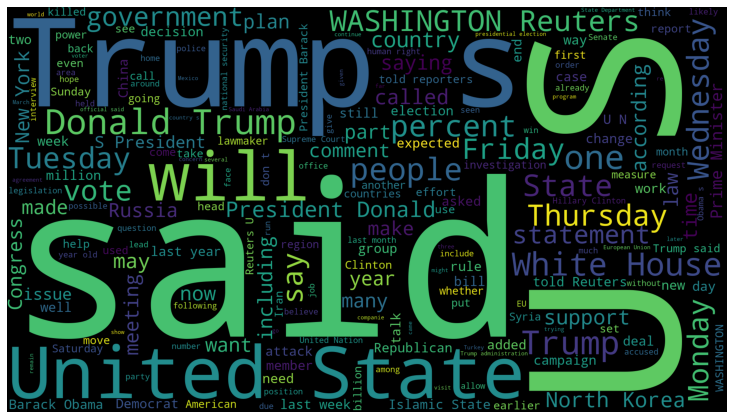

In [ ]:
wordcloud=WordCloud(width=1920, height=1080).generate (text) 
fig = plt.figure(figsize=(10, 10)) 
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout (pad=0) 
plt.show()

In [ ]:
real.sample(5)

,title,text,subject,date
13362,"Quake hits southeast Iran, destroys homes; no ...",ANKARA (Reuters) - A strong earthquake of magn...,worldnews,"December 1, 2017"
9181,"Stung by criticism, Trump vows to work for eth...",WASHINGTON (Reuters) - U.S. Republican preside...,politicsNews,"June 10, 2016"
14640,U.S.-backed Syria forces say Turkey pressured ...,BEIRUT (Reuters) - The U.S.-backed Syrian Demo...,worldnews,"November 16, 2017"
12482,EU's Barnier rules out full EU-UK trade pact i...,BRUSSELS (Reuters) - There is no possibility ...,worldnews,"December 12, 2017"
15533,U.S. praises Saudi Arabia for exposing Iran's ...,WASHINGTON (Reuters) - The United States on Mo...,worldnews,"November 6, 2017"


In [ ]:
unknown_publishers=[] 
for index, row in enumerate(real.text.values): 
  try: 
    record - row.split('-', maxsplit=1)
    record[1]

    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)

In [ ]:
len(unknown_publishers)

21417

In [ ]:
real.iloc[unknown_publishers].text

0        WASHINGTON (Reuters) - The head of a conservat...
1        WASHINGTON (Reuters) - Transgender people will...
2        WASHINGTON (Reuters) - The special counsel inv...
3        WASHINGTON (Reuters) - Trump campaign adviser ...
4        SEATTLE/WASHINGTON (Reuters) - President Donal...
                               ...                        
21412    BRUSSELS (Reuters) - NATO allies on Tuesday we...
21413    LONDON (Reuters) - LexisNexis, a provider of l...
21414    MINSK (Reuters) - In the shadow of disused Sov...
21415    MOSCOW (Reuters) - Vatican Secretary of State ...
21416    JAKARTA (Reuters) - Indonesia will buy 11 Sukh...
Name: text, Length: 21417, dtype: object

In [ ]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [ ]:
real=real.drop(8970,axis=0)

In [ ]:
publisher = []
tmp_text = []
for index, row in enumerate (real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row) 
    publisher.append('Unknown')

  else:
    record = row.split('-', maxsplit=1) 
    publisher.append(record[0].strip()) 
    tmp_text.append(record[1].strip())

In [ ]:
real['publisher']=publisher
real['text']=tmp_text

In [ ]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",Unknown
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",Unknown
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",Unknown
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",Unknown
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",Unknown


In [ ]:
real.shape

(21416, 5)

In [ ]:
empty_fake_index=[index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [ ]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
real['text']=real['title']+real['text'] 
fake['text'] = fake['title'] + " " + fake['text']

In [ ]:
real['text'] = real['text'].apply(lambda x: str(x).lower()) 
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

In [ ]:
real['class'] = 1
fake['class'] = 0

In [ ]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [ ]:
real=real[['text', 'class']]

In [ ]:
fake=fake[['text', 'class']]

In [ ]:
data = real.append(fake, ignore_index=True)
data.shape

(44897, 2)

In [ ]:
data.sample(5)

,text,class
34535,clinton global initiative member to moderate f...,0
1919,trump says u.s. considering global trade embar...,1
7409,melania's slovenian hometown eyes trump win as...,1
32886,trump says “yes” to federal funding for planne...,0
29510,bombshell: scalia wanted a liberal on the cou...,0


In [ ]:
!pip install spacy--2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4--4.9.1
!pip install textblob--0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement spacy--2.2.3 (from versions: none)
ERROR: No matching distribution found for spacy--2.2.3
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.8 MB 27.0 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement beautifulsoup4--4.9.1 (from versions: none)
ERROR: No matching distribution found for beautifulsoup4--4.9.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement textblob--0.15.3 (from versions: none)
ERROR: No matching

In [ ]:
import preprocess_kgptalkie as ps

/usr/local/lib/python3.7/dist-packages/spacy/language.py:1899: UserWarning: [W123] Argument disable with value [] is used instead of ['senter'] as specified in the config. Be aware that this might affect other components in your pipeline.
  config_value=config["nlp"][key],


In [ ]:
 data['text'] = data['text'].apply(lambda x: ps.remove_special_chars(x))

In [ ]:
ps.remove_special_chars('this. @ # is gre@t')

'this is gret'

In [ ]:
data.head()

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1


In [ ]:
import gensim

In [ ]:
y = data['class'].values

In [ ]:
X=[d.split() for d in data['text'].tolist()]

In [ ]:
type(X[8])

list

In [ ]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'scriptwashington', 'reuters', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to

In [ ]:
DIM = 180
w2v_model = gensim.models.Word2Vec (sentences=X, size=DIM, window=10, min_count=1)

In [ ]:
words1 = w2v_model.wv.vocab

In [ ]:
len(w2v_model.wv.vocab)

In [ ]:
w2v_model.wv["love"]

In [ ]:
w2v_model.wv.most_similar("joseph")

In [ ]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [ ]:
X=tokenizer.texts_to_sequences(X)
X

[[18,
  30,
  475,
  483,
  12940,
  134,
  8089,
  40,
  1375,
  131193,
  72,
  1,
  423,
  3,
  4,
  301,
  80,
  6325,
  6,
  1,
  30,
  191,
  29,
  772,
  26,
  278,
  9,
  4,
  1104,
  2973,
  3,
  1,
  124,
  952,
  2,
  446,
  9,
  185,
  1198,
  174,
  391,
  4,
  1375,
  301,
  8,
  342,
  5,
  1108,
  475,
  7839,
  6,
  1200,
  6,
  1761,
  16,
  4,
  3402,
  7931,
  141,
  165,
  318,
  134,
  30,
  798,
  921,
  7803,
  674,
  8,
  2008,
  472,
  1,
  383,
  1757,
  4,
  557,
  588,
  8,
  168,
  694,
  50,
  409,
  28,
  17349,
  2,
  90,
  1353,
  66,
  6,
  410,
  60,
  32,
  777,
  25,
  1,
  8128,
  8,
  204,
  409,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  475,
  6,
  4,
  483,
  303,
  2,
  22,
  1956,
  2,
  81,
  429,
  170,
  18,
  314,
  209,
  108,
  18,
  1,
  514,
  568,
  98,
  1783,
  1503,
  6,
  50,
  134,
  39,
  1070,
  2,
  375,
  349,
  3,
  191,
  37,
  68,
  14,
  5,
  19,
  134,
  183,
  4,
  377,
  475,
  958,
  6,
  171,
  694,
  111,
  19

In [ ]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'he': 12,
 'said': 13,
 'trump': 14,
 'it': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'be': 22,
 'have': 23,
 'not': 24,
 'from': 25,
 'this': 26,
 'at': 27,
 'are': 28,
 'who': 29,
 'us': 30,
 'an': 31,
 'they': 32,
 'i': 33,
 'but': 34,
 'we': 35,
 'would': 36,
 'president': 37,
 'about': 38,
 'will': 39,
 'their': 40,
 'had': 41,
 'you': 42,
 't': 43,
 'been': 44,
 'were': 45,
 'people': 46,
 'more': 47,
 'or': 48,
 'after': 49,
 'which': 50,
 'she': 51,
 'her': 52,
 'one': 53,
 'if': 54,
 'its': 55,
 'out': 56,
 'all': 57,
 'what': 58,
 'state': 59,
 'when': 60,
 'new': 61,
 'also': 62,
 'up': 63,
 'there': 64,
 'no': 65,
 'over': 66,
 'house': 67,
 'donald': 68,
 'our': 69,
 'states': 70,
 'clinton': 71,
 'reuters': 72,
 'obama': 73,
 'government': 74,
 'can': 75,
 'just': 76,
 'him': 77,
 'so': 78,
 'than': 79,
 'republican': 80,
 '

(array([3.250e+02, 5.710e+02, 3.870e+02, 4.660e+02, 4.790e+02, 6.630e+02,
        1.064e+03, 1.040e+03, 1.032e+03, 8.070e+02, 6.370e+02, 6.240e+02,
        5.000e+02, 4.520e+02, 4.990e+02, 4.650e+02, 5.260e+02, 5.510e+02,
        5.410e+02, 6.380e+02, 6.090e+02, 6.190e+02, 7.350e+02, 6.470e+02,
        7.850e+02, 7.400e+02, 7.430e+02, 1.039e+03, 9.860e+02, 1.115e+03,
        1.157e+03, 1.022e+03, 1.127e+03, 1.147e+03, 1.210e+03, 1.373e+03,
        8.760e+02, 8.760e+02, 8.070e+02, 7.100e+02, 7.080e+02, 6.230e+02,
        5.880e+02, 6.520e+02, 5.500e+02, 5.380e+02, 4.770e+02, 4.490e+02,
        4.680e+02, 3.830e+02, 3.760e+02, 4.310e+02, 3.500e+02, 3.610e+02,
        3.220e+02, 2.730e+02, 3.370e+02, 2.760e+02, 3.030e+02, 2.770e+02,
        2.520e+02, 2.280e+02, 1.970e+02, 2.140e+02, 2.230e+02, 1.980e+02,
        1.840e+02, 1.980e+02, 1.670e+02, 1.930e+02, 1.900e+02, 1.750e+02,
        1.660e+02, 1.490e+02, 1.450e+02, 1.530e+02, 1.230e+02, 1.160e+02,
        1.180e+02, 9.800e+01, 8.400e+0

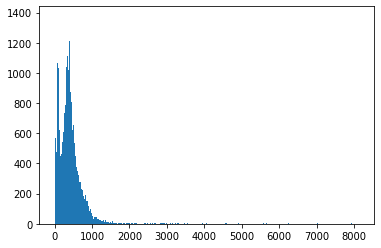

In [ ]:
plt.hist([len(x) for x in X], bins=700)

In [ ]:
nos = np.array([len(x) for x in X]) 
len(nos[nos>1000])

1590

In [ ]:
maxlen = 1000
X = pad_sequences (X, maxlen=maxlen)

In [ ]:
len(X[101])

1000

In [ ]:
vocab_size = len(tokenizer.word_index) + 1 
vocab = tokenizer.word_index

In [ ]:
 def get_weight_matrix(model): 
   weight_matrix = np.zeros((vocab_size, DIM))

   for word, i in vocab.items(): 
     weight_matrix[i]=model.wv[word]

   return weight_matrix

In [ ]:
embedding_vectors = get_weight_matrix(w2v_model)

In [ ]:
embedding_vectors.shape

(244207, 180)

In [ ]:
model=Sequential()
model.add(Embedding (vocab_size, output_dim=DIM, weights = [embedding_vectors], input_length=maxlen, trainable=False)) 
model.add(LSTM(units=128)) 
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer= 'adam', loss ='binary_crossentropy', metrics=['acc'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 180)         43957260  
                                                                 
 lstm (LSTM)                 (None, 128)               158208    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 44,115,597
Trainable params: 158,337
Non-trainable params: 43,957,260
_________________________________________________________________


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [ ]:
model.fit(X_train, y_train, validation_split=0.3, epochs=6)

Epoch 1/6
737/737 [==============================] - 37s 43ms/step - loss: 0.1299 - acc: 0.9510 - val_loss: 0.0535 - val_acc: 0.9853
Epoch 2/6
737/737 [==============================] - 31s 43ms/step - loss: 0.0456 - acc: 0.9859 - val_loss: 0.1305 - val_acc: 0.9426
Epoch 3/6
737/737 [==============================] - 31s 42ms/step - loss: 0.0298 - acc: 0.9899 - val_loss: 0.0270 - val_acc: 0.9913
Epoch 4/6
737/737 [==============================] - 31s 42ms/step - loss: 0.0213 - acc: 0.9935 - val_loss: 0.0251 - val_acc: 0.9924
Epoch 5/6
737/737 [==============================] - 31s 42ms/step - loss: 0.0116 - acc: 0.9969 - val_loss: 0.0198 - val_acc: 0.9939
Epoch 6/6
737/737 [==============================] - 31s 42ms/step - loss: 0.0125 - acc: 0.9961 - val_loss: 0.0197 - val_acc: 0.9934


In [ ]:
y_pred=(model.predict(X_test) >=0.5).astype(int)

351/351 [==============================] - 5s 14ms/step


In [ ]:
accuracy_score(y_test, y_pred)

0.9918930957683741

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5785
           1       1.00      0.99      0.99      5440

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [ ]:
x=["this is a news"]

In [ ]:
X_test

array([[   0,    0,    0, ..., 7122,   28, 2224],
       [   0,    0,    0, ...,  198,  176, 4117],
       [   0,    0,    0, ..., 1757, 6591,  477],
       ...,
       [   0,    0,    0, ...,  199,   51,  403],
       [   0,    0,    0, ...,   11, 8619,  155],
       [   0,    0,    0, ...,   31, 1818,  248]], dtype=int32)

In [ ]:
x = ["But after three years, the probe, led by former U.S. Attorney-turned-special counsel John Durham, is quietly slinking to its sunset, the FBI’s “crime of the century” that Trump predicted Durham would uncover to be found as the probe limps to an anticlimactic end."]
x = tokenizer.texts_to_sequences(x) 
x

[[34,
  49,
  234,
  116,
  1,
  1215,
  617,
  20,
  105,
  5123,
  10,
  437,
  891,
  481,
  1325,
  308,
  10441,
  11,
  4514,
  56175,
  2,
  55,
  10746,
  1,
  3,
  1,
  7,
  14,
  3929,
  10441,
  36,
  11743,
  2,
  22,
  345,
  18,
  1,
  1215,
  56487,
  2,
  31,
  257]]

In [ ]:
x = pad_sequences(x, maxlen=maxlen)

In [ ]:
(model.predict(x) >=0.5).astype(int)

1/1 [==============================] - 0s 24ms/step


array([[0]])